# Introduction

Let's create an image captioning model from scratch using the [Flickr8k dataset](https://www.kaggle.com/datasets/adityajn105/flickr8k).

The final model will be able take as input a model and output a text caption for
it explaining the contents of the image.

## Overview

We will do the following this project.
- Importing and Organising the Dataset
- Extract Features from Images
- Processing Vocabulary
- Training the Main Model
- Generating Text from Images

# Imports

Importing the relevant libraries to be used in this project.

- `numpy` - Mathematics Library for computations.
- `datetime` - To use and manupilate dates and times.
- `tensorflow` - Building networks and running tests.
- `matplotlib` - To plot graphs.
- `os` - To do Input/Ouput operations.
- `tqdm` - To track and display processes.
- `pickle` - To save objects in an easy manner.

In [ ]:
# NumPy
import numpy as np

# DateTime
import datetime 

# Tensor Flow
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Input, LSTM, Embedding, Dropout, add
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.utils import plot_model, to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.applications.vgg16 import preprocess_input

# MatPlotLib
import matplotlib.pyplot as plt

# IO Operations
import os

# TQDM
from tqdm.notebook import tqdm

# Pickle
import pickle

# Organising Dataset

We will be creating a folder, downloading the dataset into the folder and then organising them as necessary.

*The dataset will be downloaded from [here](https://github.com/jbrownlee/Datasets/releases/tag/Flickr8k). Credits to [JBrownLee](https://github.com/jbrownlee) for the releases.*

## Downloading Dataset

In [ ]:
# Create a directory
!mkdir flickr_dataset

# Downloading the dataset into the created folder
!wget -P flickr_dataset -q --show-progress https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_Dataset.zip

# Downloading the caption into the created folder
!wget -P flickr_dataset -q --show-progress https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_text.zip

Flickr8k_Dataset.zi 100%[===================>]   1.04G   137MB/s    in 7.4s    
Flickr8k_text.zip   100%[===================>]   2.23M  --.-KB/s    in 0.07s   


## Unzipping Downloaded DataSet

In [ ]:
# Unzip the dataset
!unzip -q flickr_dataset/Flickr8k_Dataset.zip -d flickr_dataset

# Unzip the captions
!unzip -q flickr_dataset/Flickr8k_text.zip -d flickr_dataset

## Removing unneccessary files

Optionally, we can remove the files we don't need.

In [ ]:
# Remove the __MACOSX folder
!rm -r flickr_dataset/__MACOSX

# Remove the Zipfiles
!rm flickr_dataset/Flickr8k_Dataset.zip
!rm flickr_dataset/Flickr8k_text.zip

# Remove text files not used
!rm flickr_dataset/CrowdFlowerAnnotations.txt
!rm flickr_dataset/ExpertAnnotations.txt
!rm flickr_dataset/Flickr8k.lemma.token.txt
!rm flickr_dataset/readme.txt
!rm flickr_dataset/Flickr_8k.devImages.txt
!rm flickr_dataset/Flickr_8k.testImages.txt
!rm flickr_dataset/Flickr_8k.trainImages.txt

# Exploring the Dataset

The Dataset consists of images and a text file which has the description of the images.

In [ ]:
# Images
flickr_images = "flickr_dataset/Flicker8k_Dataset/"

# Text file containing the captions
flickr_text = "flickr_dataset/Flickr8k.token.txt"

# Exported Models
EXPORT_MODEL_DIR = "export_model"
!mkdir export_model

In [ ]:
# Print out 3 lines from the Captions
f = open(flickr_text, "r")
print(f.readline())
print(f.readline())
print(f.readline())
f.close()

# List the images and print the count
jpgs = os.listdir(flickr_images)
print(f"The number of jpg files in Flicker8k : {format(len(jpgs))}")

1000268201_693b08cb0e.jpg#0	A child in a pink dress is climbing up a set of stairs in an entry way .

1000268201_693b08cb0e.jpg#1	A girl going into a wooden building .

1000268201_693b08cb0e.jpg#2	A little girl climbing into a wooden playhouse .

The number of jpg files in Flicker8k : 8091


# Creating Neural Network to extract features of Image

We'll be building a neural network from scratch based on VGG-16 CNN.

## Layer 1
- 224 x 224 x 3 Inputs
- 64 output filters
- 3 x 3 Convolution window
- Adding Padding
- Using ReLu Activation Function

## Layer 2
### Convolution
- 64 output filters
- 3 x 3 Convolution window
- Adding Padding
- Using ReLu Activation Function

### Pooling
- 2 x 2 Pooling window
- 2 x 2 Pooling Step

## Layer 3
### 2 x Convolution
- 128 output filters
- 3 x 3 Convolution window
- Adding Padding
- Using ReLu Activation Function

### Pooling
- 2 x 2 Pooling window
- 2 x 2 Pooling step

## Layer 4
### 3 x Convolution
- 256 output filters
- Same as before

### Pooling
- Same as before

## Layer 5
### 3 x Convolution
- 512 output filters
- Same as before

### Pooling
- Same as before

## Layer 6 
- Same as Layer 5

## Layer 7
- Flattening the Pixels
- 4096 units x 2 
- ReLu activation function

In [ ]:
# Create the Model Object
model = Sequential()

# Layer 1
model.add(Conv2D(input_shape = (224, 224, 3), filters = 64, kernel_size = 3, padding = "same", activation = "relu"))

# Layer 2
model.add(Conv2D(filters = 64, kernel_size = 3, padding = "same", activation = "relu"))
model.add(MaxPool2D(pool_size = 2))

# Layer 3
model.add(Conv2D(filters = 128, kernel_size = 3, padding = "same", activation = "relu"))
model.add(Conv2D(filters = 128, kernel_size = 3, padding = "same", activation = "relu"))
model.add(MaxPool2D(pool_size = 2))

# Layer 4
model.add(Conv2D(filters = 256, kernel_size = 3, padding = "same", activation = "relu"))
model.add(Conv2D(filters = 256, kernel_size = 3, padding = "same", activation = "relu"))
model.add(Conv2D(filters = 256, kernel_size = 3, padding = "same", activation = "relu"))
model.add(MaxPool2D(pool_size = 2))

# Layer 5
model.add(Conv2D(filters = 512, kernel_size = 3, padding = "same", activation = "relu"))
model.add(Conv2D(filters = 512, kernel_size = 3, padding = "same", activation = "relu"))
model.add(Conv2D(filters = 512, kernel_size = 3, padding = "same", activation = "relu"))
model.add(MaxPool2D(pool_size = 2))

# Layer 6
model.add(Conv2D(filters = 512, kernel_size = 3, padding = "same", activation = "relu"))
model.add(Conv2D(filters = 512, kernel_size = 3, padding = "same", activation = "relu"))
model.add(Conv2D(filters = 512, kernel_size = 3, padding = "same", activation = "relu"))
model.add(MaxPool2D(pool_size = 2))

# Layer 7
model.add(Flatten())
model.add(Dense(units = 4096, activation = "relu"))
model.add(Dense(units = 4096, activation = "relu"))

# Removing below Dense layer since it is not needed
# model.add(Dense(units = 2, activation = "softmax"))

In [ ]:
# Loss and Back Prop Setup
model.compile(optimizer = Adam(learning_rate=0.001), loss = CategoricalCrossentropy(), metrics = ['accuracy'])


# Displaying the Model (Uncomment either one of the two)
print(model.summary())
# plot_model(model, show_shapes = True, show_dtype = True, dpi = 50, show_layer_activations = True)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 64)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 112, 112, 128)     73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 112, 112, 128)     147584    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 56, 56, 128)      0         
 2D)                                                    

# Extracting Features from Images

We'll be using the Neural Network created earlier to extract the features from the dataset and then save them into a variable.

In [ ]:
# Dictionary for the features
features = {}

# Looping over every image inside the Flicker Extracted Directory
for img_name in tqdm(os.listdir(flickr_images)):
  # Calling the file name
  img_path = os.path.join(flickr_images, img_name)
  # Loading the image with a size of 224 x 224
  image = load_img(img_path, target_size = (224,224))
  # Convert the image into pixel arrays
  image = img_to_array(image)
  # Reshape the array for model
  image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
  # Preprocessing numpy array to convert from RGB to BGR, and zero-center each channel
  image = preprocess_input(image)
  # Extract Features via the model
  feature = model.predict(image, verbose = 0)
  # Get Image ID - Removing the extension
  image_id = img_name.split('.')[0]
  # Store Generated feature in the variable
  features[image_id] = feature

  0%|          | 0/8091 [00:00<?, ?it/s]

In [ ]:
# Displaying the number of features
print(len(features))

8091


## Saving Features

Extracting features can take some time, we don't do all that again when we change environments or re-run the environment. So instead of re-generating it everytime, we can write it into a file and then extract it back.

We'll be using a module called [Pickle](https://docs.python.org/3/library/pickle.html) for that.

In [ ]:
# Store Features into a file
pickle.dump(features, open(f"{EXPORT_MODEL_DIR}/features.pkl", "wb"))

You can download the features file from [here](#). Make sure to move it into the `export_model` folder. The file must be labelled as `features.pkl`.

**CHANGE THIS**

In [ ]:
# Run the command after uploading the file
with open(f"{EXPORT_MODEL_DIR}/features.pkl", "rb") as f:
  features = pickle.load(f)

# Loading in Captions

There is a single file that contains all the image IDs with the captions respectively.

We'll be importing that and then processing and divided the images into Test, Validating and Training respectively.

In [ ]:
# Loading all Captions
with open(flickr_text, "r") as f:
  next(f)
  captions_doc = f.read()

## Splitting Image ID and Captions

In [ ]:
# Dictionary to store the captions for image ID
mapping = {}

for line in tqdm(captions_doc.split('\n')):
  # Skipping lines that are bad
  if len(line) < 2:
    continue
  # Split the line by .jpg
  tokens = line.split('.jpg')
  # Saving Image ID and the rest as caption
  image_id, caption = tokens[0], tokens[1:]
  # Breaking into spaces and removing the unnecessary parts of the caption
  caption = " ".join(caption)
  caption = caption[3:]
  # Only adding if a feature exists for that image ID
  if image_id not in features:
    print(f"Not in Features - Image ID : {image_id}, Caption : {caption}")
    continue
  # If Image ID not already saved, so make an array for that image id
  if image_id not in mapping:
    mapping[image_id] = []
  # Add in the caption 
  mapping[image_id].append(caption)

print(f"\nMapping Length : {len(mapping)}")

  0%|          | 0/40460 [00:00<?, ?it/s]

Not in Features - Image ID : 2258277193_586949ec62, Caption : 0	people waiting for the subway
Not in Features - Image ID : 2258277193_586949ec62, Caption : 1	Some people looking out windows in a large building .
Not in Features - Image ID : 2258277193_586949ec62, Caption : 2	Three people are waiting on a train platform .
Not in Features - Image ID : 2258277193_586949ec62, Caption : 3	Three people standing at a station .
Not in Features - Image ID : 2258277193_586949ec62, Caption : 4	two woman and one man standing near train tracks .

Mapping Length : 8091


## Preprocess the Captions

We'll be cleaning up the caption data for better results

In [ ]:
# Before
mapping['3249062399_0dafe5e4f5']

['Three Asian women , one elderly , one a child and one an adult crossing a street .',
 'Three women in hats walk down a sidewalk .',
 'Three women in white hats in a line .',
 'Three women , one old , one young and one a child , walk down a street .',
 'Three women walk in a line on the sidewalk .']

In [ ]:
for key, captions in mapping.items():
  for i in range (len(captions)):
    # Take one caption
    caption = captions[i]
    # Convert to lowercase
    caption = caption.lower()
    # Delete digits and special characters
    caption = caption.replace("[^A-Za-z]", "")
    # Delete additional spaces
    caption = caption.replace("\s+", " ")
    # Add start and end tags
    caption = 'startseq ' + " ".join([word for word in caption.split() if len(word) > 1]) + ' endseq'
    # Set it back
    captions[i] = caption

In [ ]:
# After
mapping['3249062399_0dafe5e4f5']

['startseq three asian women one elderly one child and one an adult crossing street endseq',
 'startseq three women in hats walk down sidewalk endseq',
 'startseq three women in white hats in line endseq',
 'startseq three women one old one young and one child walk down street endseq',
 'startseq three women walk in line on the sidewalk endseq']

Let's store all the processed captions into a list

In [ ]:
all_captions = []

# Adding the captions
for key in mapping:
  for caption in mapping[key]:
    all_captions.append(caption)

# Display the length of Captions
print(f"Captions Store : {len(all_captions)}")

# Print some values
print(all_captions[:10])

Captions Store : 40454
['startseq girl going into wooden building endseq', 'startseq little girl climbing into wooden playhouse endseq', 'startseq little girl climbing the stairs to her playhouse endseq', 'startseq little girl in pink dress going into wooden cabin endseq', 'startseq black dog and spotted dog are fighting endseq', 'startseq black dog and tri-colored dog playing with each other on the road endseq', 'startseq black dog and white dog with brown spots are staring at each other in the street endseq', 'startseq two dogs of different breeds looking at each other on the road endseq', 'startseq two dogs on pavement moving toward each other endseq', 'startseq little girl covered in paint sits in front of painted rainbow with her hands in bowl endseq']


## Tokenizing the text

We'll be dividing the texts into meaningful pieces.

In [ ]:
# Creating the Tokenizer
tokenizer = Tokenizer()

# Running the process
tokenizer.fit_on_texts(all_captions)

# Number of unique words
vocab_size = len(tokenizer.word_index) + 1
print(f"Number of unique words : {vocab_size}\n")

# Display as JSON
tokenizer.to_json()

Number of unique words : 8484



'{"class_name": "Tokenizer", "config": {"num_words": null, "filters": "!\\"#$%&()*+,-./:;<=>?@[\\\\]^_`{|}~\\t\\n", "lower": true, "split": " ", "char_level": false, "oov_token": null, "document_count": 40454, "word_counts": "{\\"startseq\\": 40454, \\"girl\\": 3328, \\"going\\": 149, \\"into\\": 1074, \\"wooden\\": 284, \\"building\\": 510, \\"endseq\\": 40454, \\"little\\": 1768, \\"climbing\\": 506, \\"playhouse\\": 6, \\"the\\": 18419, \\"stairs\\": 108, \\"to\\": 3176, \\"her\\": 1178, \\"in\\": 18984, \\"pink\\": 738, \\"dress\\": 347, \\"cabin\\": 4, \\"black\\": 3848, \\"dog\\": 8138, \\"and\\": 8862, \\"spotted\\": 38, \\"are\\": 3504, \\"fighting\\": 133, \\"tri\\": 14, \\"colored\\": 221, \\"playing\\": 2008, \\"with\\": 7765, \\"each\\": 430, \\"other\\": 773, \\"on\\": 10745, \\"road\\": 398, \\"white\\": 3959, \\"brown\\": 2578, \\"spots\\": 29, \\"staring\\": 57, \\"at\\": 2915, \\"street\\": 944, \\"two\\": 5642, \\"dogs\\": 2125, \\"of\\": 6722, \\"different\\": 46, \\

In [ ]:
# Get the maximum length of the caption available for adding padding
max_length = max(len(caption.split()) for caption in all_captions)
print(f"Max Length : {max_length}")

Max Length : 34


# Train-Test Split

We'll be dividing as follows:

- 80% Training
- 20% Testing

In [ ]:
# Converting to a list and then spitting
image_ids = list(mapping.keys())
split = int(len(image_ids) * 0.80)

# Training Dataset
train = image_ids[:split]
print(f"Training Dataset : {len(train)}")

# Testing Dataset
test = image_ids[split:]
print(f"Testing Dataset : {len(test)}")

Training Dataset : 6472
Testing Dataset : 1619


In [ ]:
# Verifying they are different
print(train[:5])
print(test[:5])

['1000268201_693b08cb0e', '1001773457_577c3a7d70', '1002674143_1b742ab4b8', '1003163366_44323f5815', '1007129816_e794419615']
['3601569729_bf4bf82768', '3601803640_5f3cb05acf', '3601843201_4809e66909', '3601978895_9fec23ce0c', '3602676311_824b2c04ba']


In [ ]:
# Data Generator to get data in batch
def data_generator(data_keys, mapping, features, tokenizer, max_length, vocab_size, batch_size):
  # Loop over images
  X1, X2, y = list(), list(), list()
  n = 0
  while 1:
    for key in data_keys:
      n += 1
      captions = mapping[key]
      # Process each caption
      for caption in captions:
        # Encode the sequence
        seq = tokenizer.texts_to_sequences([caption])[0]
        # Split the sequence into X, Y paris
        for i in range(1, len(seq)):
          # Split into input and output pairs
          in_seq, out_seq = seq[:i], seq[i]
          # Pad Input Sequence
          in_seq = pad_sequences([in_seq], maxlen = max_length)[0]
          # Encode Output Sequence
          out_seq = to_categorical([out_seq], num_classes = vocab_size)[0]
          # Check if image exists
          # if key not in features:
          #   continue
          # Store the sequences
          X1.append(features[key][0])
          X2.append(in_seq)
          y.append(out_seq)
      if n == batch_size:
        X1, X2, y = np.array(X1), np.array(X2), np.array(y)
        yield [X1, X2], y
        X1, X2, y = list(), list(), list()
        n = 0

# Main Training Model

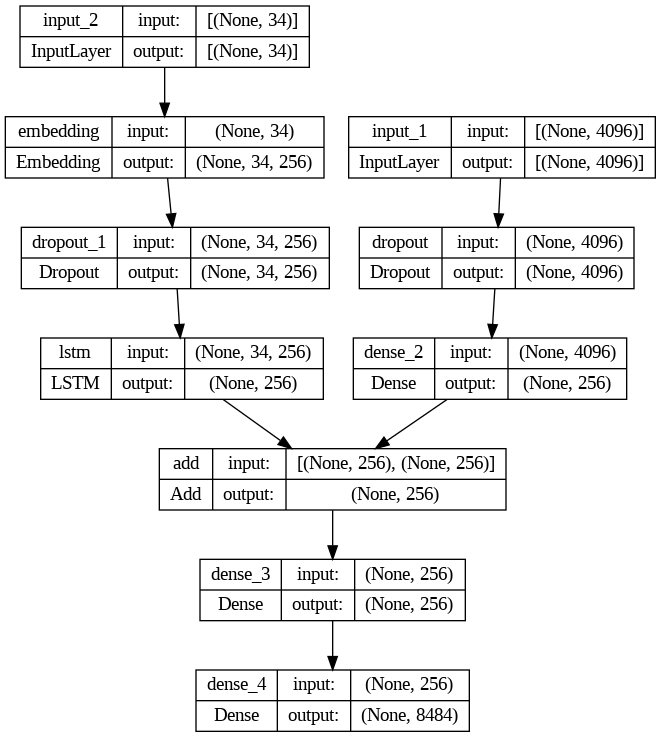

In [ ]:
# Image Feature Layers
inputs1 = Input(shape = (4096,))
fe1 = Dropout(0.4)(inputs1)
fe2 = Dense(256, activation = "relu")(fe1)

# Sequence Feature Layers
inputs2 = Input(shape = (max_length,))
se1 = Embedding(vocab_size, 256, mask_zero = True)(inputs2)
se2 = Dropout(0.4)(se1)
se3 = LSTM(256)(se2)

# Decoder Model
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation = "relu")(decoder1)
outputs = Dense(vocab_size, activation = "softmax")(decoder2)

# Compiling the Model
main_model = Model(inputs = [inputs1, inputs2], outputs = outputs)
main_model.compile(loss = "categorical_crossentropy", optimizer = "adam", metrics=["accuracy"])

# Plot the Model
plot_model(main_model, show_shapes = True)

# Training Process

Now we'll be running the training process to train our model.

### Loading Weights

We can load the weights if they are saved as well. Make sure the file name is `main_model_weights.hdf5` and is under the `export_model` folder.

In [ ]:
# Loading weights
main_model.load_weights(f"{EXPORT_MODEL_DIR}/main_model_weights.hdf5")

You can skip the below section if you have loaded the weights.

In [ ]:
# Training stats
epochs = 20
batch_size = 32
steps = len(train) // batch_size

for i in range(epochs):
  # Iteration Setup
  log_dir = f'logs/epochs_{epochs}'
  tensorboard_callback = TensorBoard(log_dir=log_dir)
  # Creating Data Generator
  generator = data_generator(train, mapping, features, tokenizer, max_length, vocab_size, batch_size)
  # Fitting for one Epoch
  main_model.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1, callbacks=[tensorboard_callback])
  # Printing Epoch
  print(f"Epoch {i+1}")

202/202 [==============================] - 58s 284ms/step - loss: 2.1383 - accuracy: 0.4650
Epoch 1
202/202 [==============================] - 57s 282ms/step - loss: 2.1171 - accuracy: 0.4694
Epoch 2
202/202 [==============================] - 58s 284ms/step - loss: 2.0962 - accuracy: 0.4727
Epoch 3
202/202 [==============================] - 57s 279ms/step - loss: 2.0794 - accuracy: 0.4756
Epoch 4
202/202 [==============================] - 57s 283ms/step - loss: 2.0613 - accuracy: 0.4785
Epoch 5
202/202 [==============================] - 57s 284ms/step - loss: 2.0489 - accuracy: 0.4808
Epoch 6
202/202 [==============================] - 58s 288ms/step - loss: 2.0336 - accuracy: 0.4837
Epoch 7
202/202 [==============================] - 58s 285ms/step - loss: 2.0185 - accuracy: 0.4861
Epoch 8
  5/202 [..............................] - ETA: 1:12 - loss: 2.0437 - accuracy: 0.4807

In [ ]:
# Saving Weights
main_model.save_weights(f"{EXPORT_MODEL_DIR}/main_model_weights.hdf5")

# Tensor Board

In [ ]:
# Load Tensor Board
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

# Generate Captions

In [ ]:
def idx_to_word(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None

In [ ]:
# generate caption for an image
def predict_caption(model, image, tokenizer, max_length):
    # add start tag for generation process
    in_text = 'startseq'
    # iterate over the max length of sequence
    for i in range(max_length):
        # encode input sequence
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        # pad the sequence
        sequence = pad_sequences([sequence], max_length)
        # predict next word
        yhat = model.predict([image, sequence], verbose=0)
        # get index with high probability
        yhat = np.argmax(yhat)
        # convert index to word
        word = idx_to_word(yhat, tokenizer)
        # stop if word not found
        if word is None:
            break
        # append word as input for generating next word
        in_text += " " + word
        # stop if we reach end tag
        if word == 'endseq':
            break
      
    return in_text

In [ ]:
from nltk.translate.bleu_score import corpus_bleu
# validate with test data
actual, predicted = list(), list()

for key in tqdm(test):
    # get actual caption
    captions = mapping[key]
    # predict the caption for image
    y_pred = predict_caption(main_model, features[key], tokenizer, max_length) 
    # split into words
    actual_captions = [caption.split() for caption in captions]
    y_pred = y_pred.split()
    # append to the list
    actual.append(actual_captions)
    predicted.append(y_pred)
    
# calcuate BLEU score
print("BLEU-1: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
print("BLEU-2: %f" % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))

  0%|          | 0/1619 [00:00<?, ?it/s]

BLEU-1: 0.464720
BLEU-2: 0.218570


In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
def generate_caption(image_name):
    # load the image
    # image_name = "1001773457_577c3a7d70.jpg"
    image_id = image_name.split('.')[0]
    img_path = os.path.join(flickr_images, image_name)
    image = Image.open(img_path)
    captions = mapping[image_id]
    print('---------------------Actual---------------------')
    for caption in captions:
        print(caption)
    # predict the caption
    y_pred = predict_caption(main_model, features[image_id], tokenizer, max_length)
    print('--------------------Predicted--------------------')
    print(y_pred)
    plt.imshow(image)

---------------------Actual---------------------
startseq black dog and spotted dog are fighting endseq
startseq black dog and tri-colored dog playing with each other on the road endseq
startseq black dog and white dog with brown spots are staring at each other in the street endseq
startseq two dogs of different breeds looking at each other on the road endseq
startseq two dogs on pavement moving toward each other endseq
--------------------Predicted--------------------
startseq two dogs are playing in the water endseq


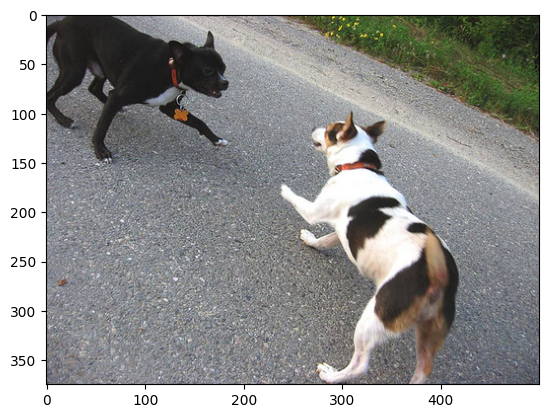

In [ ]:
generate_caption("1001773457_577c3a7d70.jpg")

---------------------Actual---------------------
startseq little girl covered in paint sits in front of painted rainbow with her hands in bowl endseq
startseq little girl is sitting in front of large painted rainbow endseq
startseq small girl in the grass plays with fingerpaints in front of white canvas with rainbow on it endseq
startseq there is girl with pigtails sitting in front of rainbow painting endseq
startseq young girl with pigtails painting outside in the grass endseq
--------------------Predicted--------------------
startseq two young girls are sitting on hay bales diving as they smile endseq


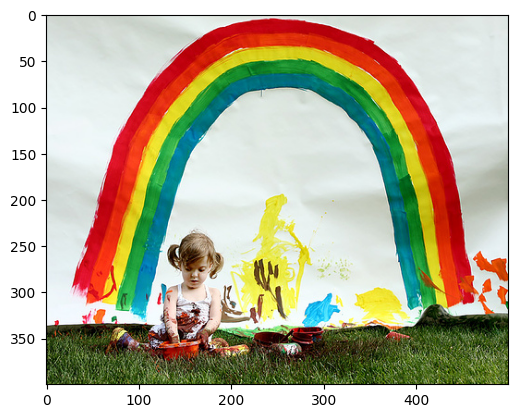

In [ ]:
generate_caption("1002674143_1b742ab4b8.jpg")

---------------------Actual---------------------
startseq man in hat is displaying pictures next to skier in blue hat endseq
startseq man skis past another man displaying paintings in the snow endseq
startseq person wearing skis looking at framed pictures set up in the snow endseq
startseq skier looks at framed pictures in the snow next to trees endseq
startseq man on skis looking at artwork for sale in the snow endseq
--------------------Predicted--------------------
startseq man in red outfit is standing in front of crowd endseq


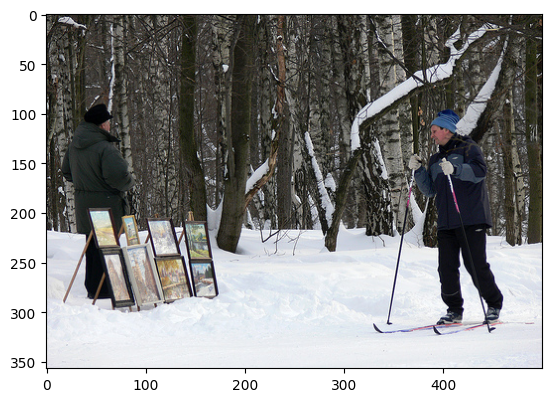

In [ ]:
generate_caption("101669240_b2d3e7f17b.jpg")

---------------------Actual---------------------
startseq group of race horses run down track carrying jockeys endseq
startseq horse race endseq
startseq jockeys on horses during race endseq
startseq the horses race on the dirt track while their riders urge them on endseq
startseq there are riders and horses in horse race going around track endseq
--------------------Predicted--------------------
startseq man in red and black is standing on the street with arms in close and pierced ears endseq


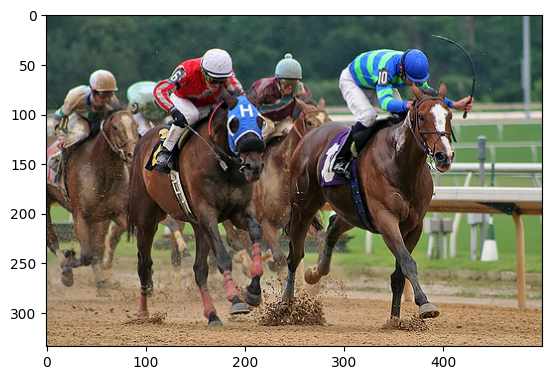

In [ ]:
generate_caption("3601569729_bf4bf82768.jpg")

---------------------Actual---------------------
startseq biker makes high jump endseq
startseq man doing an aerial stunt on bike endseq
startseq man on bicycle performing jump endseq
startseq person on bicycle wears helmet and jumps soaring over the ground in front of skyline and lake endseq
startseq the cyclist is making high jump with his bike endseq
--------------------Predicted--------------------
startseq man in wetsuit is throwing up green and yellow sail endseq


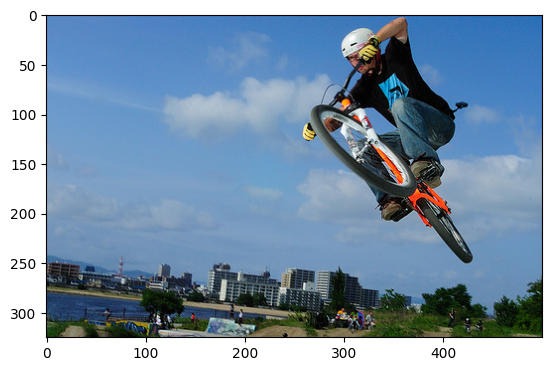

In [ ]:
generate_caption("3602676311_824b2c04ba.jpg")

# Credits

- [VGG16 → from scratch using Transfer Learning with Keras and TensorFlow 2](https://narenltk.medium.com/vgg16-from-scratch-using-transfer-learning-with-keras-and-tensorflow-ffee5ae460fb)
- 